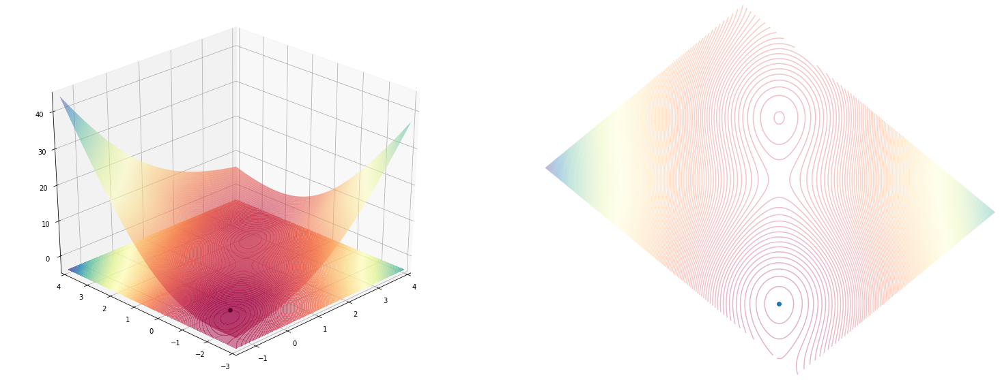

In [42]:
plot_function(mc_cormick(), angle=225);

# Goal

I've just stumbled upon this [wiki page](https://en.wikipedia.org/wiki/Derivative-free_optimization) which describes optimisation methods that can be used for optimising functions or (or programs) where you don't know or is hard to compute a derivative for it.

I plan to implement some optimizers from that page and see how they work, but before doing that I realized that I also need a simulation environment where I can see how the optimisation is progressing.

In the end, the simulation looks something like this.

In [41]:
import matplotlib.animation as animation
from IPython.display import HTML, display

x, y = [0.], [0.]

def sgd_update(x, y, learning_rate=0.01):
    d_x, d_y = function_grad(x, y)
    x = x - learning_rate * d_x
    y = y - learning_rate * d_y
    return x, y


def single_frame(i, _ax_3d, _ax_2d):
    _ax_3d.clear()
    _ax_2d.clear()
    angle = 225
    _x, _y = sgd_update(x[-1], y[-1], learning_rate=0.01)        
    x.append(float(_x)), y.append(float(_y))

    plot_function(function, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d, angle=angle)
    _ax_2d.scatter(*rotate(np.array(x), np.array(y), angle=angle), c=np.arange(len(x)), cmap='binary')

    _ax_2d.plot()


function = himmelblau()
function_grad = grad(function, argnums=(0, 1))

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(function, fig=fig)
fig.tight_layout()

frames = 20
animator = animation.FuncAnimation(fig, single_frame, fargs=(ax_3d, ax_2d), frames=frames, interval=250, blit=False)
display(HTML(animator.to_html5_video()))
plt.close();

In [77]:
import matplotlib.animation as animation
from IPython.display import HTML, display


def single_frame(i, optimisation, _ax_3d, _ax_2d, angle):
    _ax_3d.clear()
    _ax_2d.clear()
    
    x, y = optimisation.update()        
    x, y = np.array(x), np.array(y)

    plot_function(optimisation.function, angle=angle, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d)
    _ax_2d.scatter(*rotate(x, y, angle=angle), c=np.arange(len(x)), cmap='cool')
    _ax_3d.scatter3D(x, y, optimisation.function(x, y), c=np.arange(len(x)), cmap='cool')

    _ax_2d.plot()


angle=225
optimisation = optimize(himmelblau())\
    .using(sgd(step_size=0.01))\
    .start_from([-0.5, -0.5])\

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(optimisation.function, fig=fig, angle=angle)
fig.tight_layout()

frames = 20
animator = animation.FuncAnimation(fig, single_frame, fargs=(optimisation, ax_3d, ax_2d, angle), frames=frames, interval=250, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

This blog post mainly documents the exploration I did and experiments I made that lead to the final form of the simulation environment.

# Testground

Optimisations algorithms (and their implementation's) performance are usualy showcased on some known mathematical functions with interesting (and hard) shapes. Some examples:


* [Rosenbrock banana function](https://en.wikipedia.org/wiki/Rosenbrock_function) $f(x_1, x_2, x_3, .., x_n) = \sum_{i=1}^{n-1}(100(x_{i+1}-x_i^2)^2+(1-x_i)^2$ 
![image.png](https://upload.wikimedia.org/wikipedia/commons/thumb/7/7e/Rosenbrock%27s_function_in_3D.pdf/page1-400px-Rosenbrock%27s_function_in_3D.pdf.jpg)

* [Himmelblau's function](https://en.wikipedia.org/wiki/Himmelblau%27s_function) $f(x, y) = (x^2+y-11)^2 + (x+y^2-7)^2$

![image.png](https://upload.wikimedia.org/wikipedia/commons/thumb/a/ad/Himmelblau_function.svg/400px-Himmelblau_function.svg.png)

* [others](https://en.wikipedia.org/wiki/Test_functions_for_optimization)


At the same time, an optimisation algorithm, starts from some where (some from multiple places all at once), and iteratively progress to the final result. So there is a trace element to this environment to see how things are moving along.

# Starting off with Himmelblau's function

I'll start with just replicating one random function from that list (Himmelblau) and implement if in pure numpy.

This function will be used to experiment different visualisation aspects of it, but in the end we will want to substitute it with any other function we wish to use.

## Numpy implementation

Following the given definition above: $$f(x, y) = (x^2+y-11)^2 + (x+y^2-7)^2$$ 
the numpy code should be quite simple to write.

In [1]:
import numpy as np
def himmelblau(x: np.ndarray, y: np.ndarray) -> np.ndarray:
    return (x**2+y-11)**2 + (x+y**2-7)**2

himmelblau(0, 1)

136

## Drawing the shape (contour) of the function

Now that we have an example function implemented, let's write the plotting code that shows the 2D countour of it. 

This is a 2D function (and we will only deal with 2D functions in our simulation) and since for every $(x,y)$ point we also have the evaluation of the function $f(x,y)$ what we actually need to represent is a $(x, y, f(x,y))$ triple.

In plain 2D you can't normally plot this kind of information (since you only have 2 dimensions) but you can artifically add a new (3rd) dimension by using **colors**.

The idea is that if you have some [colormap](https://matplotlib.org/3.2.1/tutorials/colors/colormaps.html) like these,

![image.png](https://matplotlib.org/3.2.1/_images/sphx_glr_colormaps_004.png)

you can replace the $f(x, y)$ value by the color you've got in that colormap. This will result in a **contour plot**. You can find a similar idea in other kind of plots like *heatmaps* or *choropleth*.

I'm no visualisation expert, quite the opposite, so some things I say may be innacurate, debatble or plain false. In such cases please leave a comment and I'll try my best to correct this post.

### 2D Contour Plot

We can visualise the contour of any function, by using the [`plt.contourf`](https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.contourf.html) function from `matplolitb`. 

This function requires from us a triple of points in (x, y, z) form, which it will use to interpolate the shape of the function. This means that we need lots of *probbing points* in the $(x,y)$ domain for which to evaluate $f(x, y)$.

What you usualy do in this instance is to create a **mesh** of points, a 2d grid of points, like the intersections of lines on a chess board.

Numpy provides a way of creating these mesh values by using the [np.meshgrid](https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html) function in conjunction with [np.linspace](https://numpy.org/doc/stable/reference/generated/numpy.linspace.html).

In [2]:
xx, yy = np.meshgrid( 
    np.linspace(-5, 5),
    np.linspace(-5, 5)
)

xx.shape, yy.shape

((50, 50), (50, 50))

The result of the above function is list of `(50, 50)` points for the x coordinate and `(50, 50)` points for the y coordinate. If you'd plot them on a scatterplot, this is how they would look like.

(-1.0, 1.0)

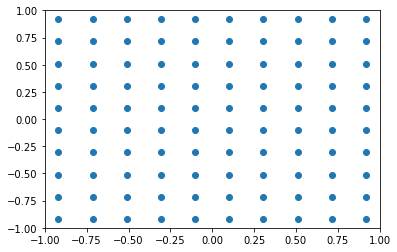

In [121]:
plt.scatter(xx, yy)
plt.xlim(-1, 1)
plt.ylim(-1, 1)

The first few values of the `yy` variable show how it is composed. It's repeated values on the first axis (i.e. rows are equal among them), and linearly spaced values (between the maximum and minimum) on the second axis (i.e. columns). 

In [3]:
yy[:3, :3]

array([[-5.        , -5.        , -5.        ],
       [-4.79591837, -4.79591837, -4.79591837],
       [-4.59183673, -4.59183673, -4.59183673]])

The `xx` variable is the opposite of `yy`. You have  equal columns (second axis) and linearly spaced values on the rows (first axis). 

In [4]:
xx[:3, :3]

array([[-5.        , -4.79591837, -4.59183673],
       [-5.        , -4.79591837, -4.59183673],
       [-5.        , -4.79591837, -4.59183673]])

Matplotlib has a function called `contourf` that will print our contours. There are some details in the code bellow, regarding the color normlization, the color map (`cmap`) and the number of `levels` we want contours for which I won't explain but are easy to understand.

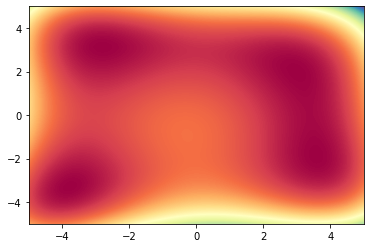

In [8]:
import numpy as np
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt
import matplotlib.colors as colors

xx, yy = np.meshgrid( 
    np.linspace(-5, 5, num=100),
    np.linspace(-5, 5, num=100)
)
zz = himmelblau(xx, yy)

plt.contourf(xx, yy, zz, levels=1000, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()))

### 3D shape

Since this is a 2D function (x, y) and the evaluation of it is a 3D dimension, we should really plot it in 3D. 

Since `matplotlib` wasn't specifically designed intially for 3D plots, the 3D addon (included in the default package) is somewhat of a patch over the 2D machinery.

In any case, it was simple enough to print the 3D shape of out plot, as you can see bellow.

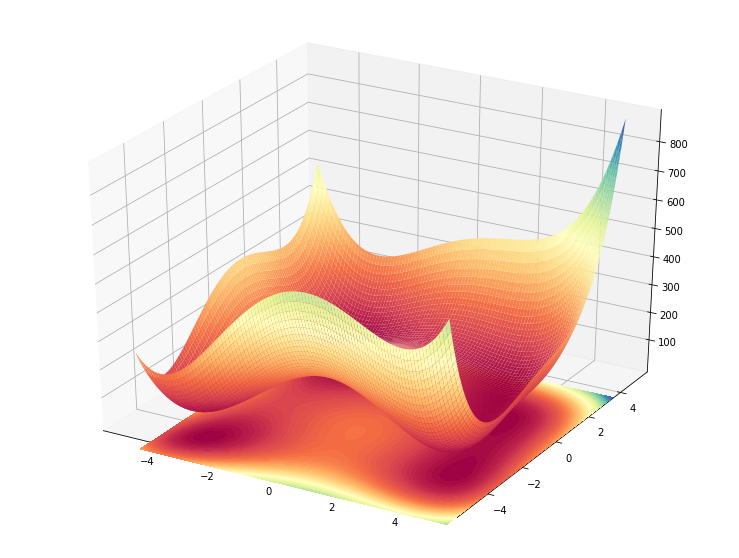

In [109]:
import matplotlib.colors as colors

plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')
ax.plot_surface(xx, yy, zz, cmap='Spectral', rcount=100, ccount=100, norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()))
ax.contourf(xx, yy, zz, levels=100, zdir='z', offset=np.min(zz)-100, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()))

# ax.view_init(50, 95)

On the other hand, some other (maybe reasonable) stuff I tried to accomplish in 3D weren't so easy, as you can see further down bellow..

## Making an animation of the function

Visualizing a 3D function by a static image is not that great. What would be great instead is if we could somehow see it in motion, rotating the graph in a 360 degree animation. In this way we could better understand the shape we are dealing with.

The two code snippets bellow quickly sketch how to use the `matplotlib.animation` package on a 3D plot.

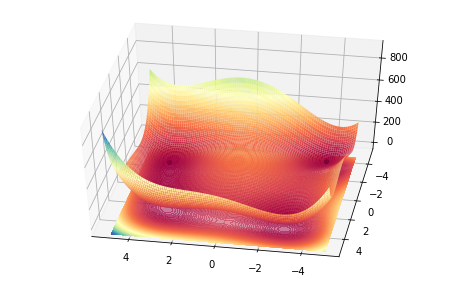

In [202]:
def single_frame(i, ax):
    ax.clear()
    ax.view_init(45, (i % 36) * 10 )
    ax.plot_surface(xx, yy, zz, cmap='Spectral', rcount=100, ccount=100, norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()))     
    ax.contourf(xx, yy, zz, levels=300, offset=np.min(zz)-100, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()), alpha=0.5)
    ax.scatter3D(min_coordinates[:, 0], min_coordinates[:, 1], himmelblau(min_coordinates[:, 0], min_coordinates[:, 1]), marker='.', color='black', s=60, alpha=1)
    ax.plot()

plt.figure(figsize=(8, 5))
ax = plt.axes(projection='3d')
single_frame(10, ax)

In [198]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')

single_frame(0, ax)
fig.tight_layout()

frames = 36
animator = animation.FuncAnimation(fig, single_frame, fargs=(ax,), frames=frames, interval=100, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

Although it looks OK, the fact that there is some transparancy to the graph makes it look a bit pixelated or rough. Let's try another rendering of the above graph but using less transparency.

In [108]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')

single_frame(0, ax)
fig.tight_layout()

frames = 36
animator = animation.FuncAnimation(fig, single_frame, fargs=(ax,), frames=frames, interval=100, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

## Displaying minimum values

Since we will use these functions for seeing how some optimisation strategies work, by minimising the functions we need to also include in the charts, the minimum points where these functions have the lowest values. 


### Finding the minimum, among the mesh grid evaluations, automatically


On way of finding the minimum values is to rely on the minimum values we find among the evaluations of the meshgrid.

This means computing the `argmax` of the `zz` mesh. But somewhat surprisingly, this returns a single value, which is the index of the minimum element in the `flattened` array.

In [26]:
np.argmin(zz)

1712

In order to recompute back the 2D coordinates (`zz` is 2D, remember?) we need to call `unravel_index` on the returned value, while specifying the shape of the array we axtracted this flattened index from.

By doing this we can recompute the coordinates (x, y) which yielded that minimum z value.

In [132]:
xx[np.unravel_index(np.argmin(zz), zz.shape)], yy[np.unravel_index(np.argmin(zz), zz.shape)]

(-3.787878787878788, -3.282828282828283)

At the same time, if we look at the original definition of the [function](https://en.wikipedia.org/wiki/Test_functions_for_optimization) we see that this function has in fact 4 minimum locations, and we only find one.

This happens because the meshgrid didn't land exactly on the minimum spots, but near them, and `argmax` returned only the smallest one, the one which by chance landed nearer one of the minimum.



Since we know that our function has 4 global minimums, some experimentation shows that these top 4 smallest evaluations lie at at most `0.08` difference appart. 

So we could in theory say that `the minimum values are all the smalles points that lie near the global minimum + a 0.08 threshold`. 

In [161]:
min_value = zz.min()
np.sum((min_value <= zz) & (zz <= (min_value + 0.08)))

4

And we can see that the coordinates we get back for these 4 points *almost* land on the minimum values.

In [162]:
xx[(min_value <= zz) & (zz <= (min_value + 0.08))], yy[(min_value <= zz) & (zz <= (min_value + 0.08))]

(array([-3.78787879,  3.58585859,  2.97979798,  2.97979798]),
 array([-3.28282828, -1.86868687,  1.96969697,  2.07070707]))

In [163]:
himmelblau(xx[(min_value <= zz) & (zz <= (min_value + 0.08))], yy[(min_value <= zz) & (zz <= (min_value + 0.08))])

array([0.00436989, 0.00616669, 0.04257242, 0.07413325])

The problem with defining it in this way is that in general, that `0.08` value is more or less wrong for other functions (actualy most of the time). 

This heuristic can't possibly work for all the functions we could implement, so we need a better way, and not rely on this heuristic.

### Using the already defined minimums

One simple and effieicent way of doing this is just hardcoding the values, but this means transforming our function into a class with multiple properties (the function evaluation, minimum and possibly others..)

In [134]:
min_coordinates = np.array([
    [3.0, 2.0],
    [-2.805118, 3.131312],
    [-3.779310, -3.283186],
    [3.584428, -1.848126]
])

himmelblau(min_coordinates[:, 0], min_coordinates[:, 1])

array([0.00000000e+00, 1.09892967e-11, 3.79786108e-12, 8.89437650e-12])

## Implementing the function as a python class

From the lessons above we conclude that a generic function will need 3 methods:
* one for evaluations of coordinates (the actual function)
* one for specifying a region of interest (the bounding boxes for the mesh grid)
* one for providing the minimum values for that function (the ROI - region of interest)
    * actualy, the function should be continous and unbound, but only a certain region, near their minimum has an insteresting shape worth looking at.

In [0]:
import numpy as np
import numpy as np
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt
import matplotlib.colors as colors
from functools import lru_cache

class Ifunction:
    def __call__(*args) -> np.ndarray:
        pass

    def min(self) -> np.ndarray:
        """
        Returns a np.array of the shape (k, 3) with all the minimum k points of this function. 
        The two values of the second dimension are the (x,y,z) coordinates of the minimum values 
        """
        return self.coord(self._min())

    def coord(self, points: np.ndarray) -> np.ndarray:
        """
        Returns a np.array of the shape (k, 3) with all the evaluations of the given
        k points of this function. 
        The three values of the second dimension are the (x,y,z) coordinates of the minimum values 
        """
        z = np.expand_dims(self(points[:, 0], points[:, 1]), axis=-1)
        return np.hstack((
            points,
            z
        ))

    def domain(self) -> np.ndarray:
        """
        Returns the ((x_min, x_max), (y_min, y_max)) values where this function 
        is of most interest
        """
        pass

Assembling everyting into a single object

In [2]:
class himmelblau(Ifunction):
    def __call__(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        """
        Computes the given function
        """
        return (x**2+y-11)**2 + (x+y**2-7)**2
    
    def _min(self) -> np.ndarray:
        """
        Returns a np.array of the shape (k, 2) with all the minimum k points of this function. 
        The two values of the second dimension are the (x,y) coordinates of the minimum values 
        """
        return np.array([
            [3.0, 2.0],
            [-2.805118, 3.131312],
            [-3.779310, -3.283186],
            [3.584428, -1.848126]
        ])

    def domain(self) -> np.ndarray:
        """
        Returns the ((x_min, x_max), (y_min, y_max)) values where this function 
        is of most interest
        """
        return np.array([
            [-5, 5],
            [-5, 5]
        ])

himmelblau().min()

array([[ 3.00000000e+00,  2.00000000e+00,  0.00000000e+00],
       [-2.80511800e+00,  3.13131200e+00,  1.09892967e-11],
       [-3.77931000e+00, -3.28318600e+00,  3.79786108e-12],
       [ 3.58442800e+00, -1.84812600e+00,  8.89437650e-12]])

## Refining the 3D contour plot

We will need to compute the contour of a function (actually the evaluation of the meshgrid) in multiple places in our code and so we will extract this computation into a function and wrap it into a `lru_cache` so we don't have to redo the math if we keep reusing the same parameters.

In [0]:
@lru_cache(maxsize=None)
def contour(function: Ifunction, x_min=-5, x_max=5, y_min=-5, y_max=5, mesh_size=100):
    """
    Returns a (x, y, z) 3D coordinates, where `z = function(x,y)` evaluated on a 
    mesh of size (mesh_size, mesh_size) generated from the linear space defined by 
    the boundaries returned by `function.domain()`.

    This function is usually used for displaying the contour of the diven function.
    """
    xx, yy = np.meshgrid( 
        np.linspace(x_min, x_max, num=mesh_size),
        np.linspace(y_min, y_max, num=mesh_size)
    )
    zz = function(xx, yy)
    return xx, yy, zz

There are also some points that I'd like to improve:
* adding the ability to zoom in and out of the plot
* adding a 2D contour projection beneath the plot
* adding the minimum values on the 3D plot
* adding the ability to control the rotation

Let's take them one by one

### Adding zoom param on the boundaries 

The idea of `zooming` is actualy closely related to the `min` and `max` boundaries set on the plots:
* if we reduce the distance between them, we *zoom in*
* if we increase the distance, we *zoom out*

Since *zoom* is usually a proportion of the current view, there's a bit of math to do in order to get the computations correct. 

This section is highly specific and beside the main point but I like to keep it just because it's time spent that I don't want to be lost to history. If you're reading this, you might probbably want to skip it since it isn't clever nor informative..

So the main idea of the zooming that I'm going to implement is described by the image bellow:
* we have some set 'min' and 'max' values
* we have a `mean` (center) between them
* we want to move both `min` and `max` closer to the `mean` by the same amunt (percentage), `f` called a `zooming factor`.

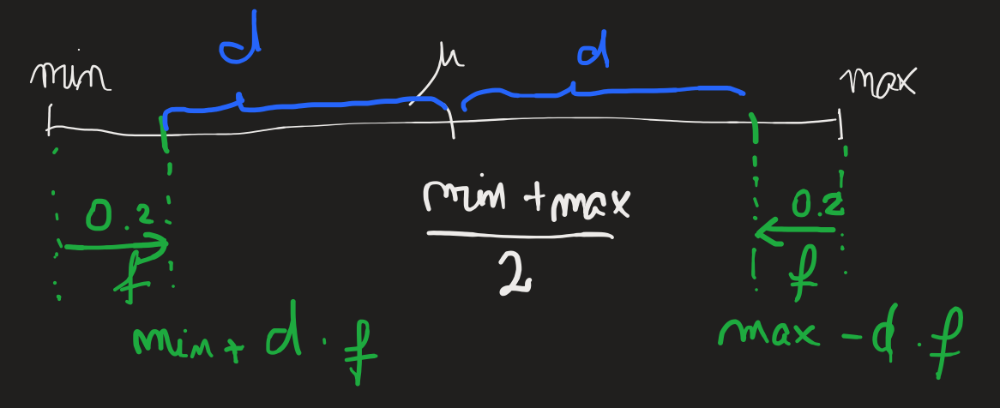

Initially, I've written this function, and it works quite well.

In [4]:
def zoom(x_domain, y_domain, zoom_factor):
    (x_min, x_max), (y_min, y_max) = x_domain, y_domain

    # zoom
    x_mean = (x_min + x_max) / 2
    y_mean = (y_min + y_max) / 2

    x_min = x_min + (x_mean - x_min) * zoom_factor
    x_max = x_max - (x_max - x_mean) * zoom_factor

    y_min = y_min + (y_mean - y_min) * zoom_factor
    y_max = y_max - (y_max - y_mean) * zoom_factor

    return (x_min, x_max), (y_min, y_max)

zoom((-5, 5), (-5, 5), 0.1)

((-4.5, 4.5), (-4.5, 4.5))

Funny enough, these can be vectorized by the numpy transformations bellow

In [5]:
d = np.array([(-5, 5), (-5, 5)])
zoom_factor = 0.1

means = d.mean(axis=-1)             # computing the means
distances = np.abs(d - means)
change = distances * zoom_factor    # compute the change need 
change_with_direction = change * [1, -1] # add signs for the direction of changes (mins should increase, maxes should decrese in value)
zoomed_d = d + change_with_direction

d + np.abs(d - d.mean(axis=-1)) * [1, -1] * zoom_factor # single line transformation

array([[-4.5,  4.5],
       [-4.5,  4.5]])

Now, we see that the above computation does, an `abs` where we eliminate the sign, and right after that we add it back by multipligin with `[-1, 1]`. If we think in terms of moving from the mean left and right we can simplify the formula a bit, as follows:

In [70]:
d.mean(axis=-1) - (d.mean(axis=-1) - d) * (1 - zoom_factor)

array([[-4.5,  4.5],
       [-4.5,  4.5]])

If we analitically decompose the `(1 - 0.1)` term and simplify the result, we remain with the bellow formula: 

In [71]:
d + (d.mean(axis=-1) - d) * zoom_factor

array([[-4.5,  4.5],
       [-4.5,  4.5]])

Which is almost identical with the one we've started from but, as we've observed, does not trim the signs and adds them back.

### Wrapping function


OK, now let's put everythign togheter and show what we have so far.

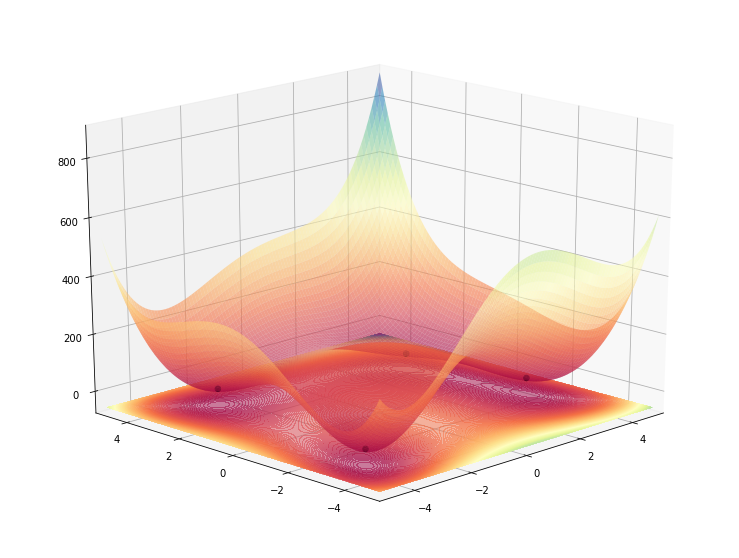

In [5]:
def plot_function_3d(function: Ifunction, ax=None, azimuth=45, angle=45, zoom_factor=0, show_projections=False):    
    (x_min, x_max), (y_min, y_max) = zoom(*function.domain(), zoom_factor)

    xx, yy, zz = contour(function, x_min, x_max, y_min, y_max)

    # evaluate once, use in multiple places
    zz_min = zz.min()
    zz_max = zz.max()
    norm = colors.Normalize(vmin=zz_min, vmax=zz_max)

    # put the 2d contour floor, a fit lower than the minimum to look like a reflection
    zz_floor_offset = int((zz_max - zz_min) * 0.065)

    # create 3D axis if not provided
    ax = ax if ax else plt.axes(projection='3d')

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_zlim(zz.min() - zz_floor_offset, zz.max())

    min_coordinates = function.min()
    ax.scatter3D(min_coordinates[:, 0], min_coordinates[:, 1], min_coordinates[:, 2], marker='.', color='black', s=120, alpha=1, zorder=1)
    
    ax.contourf(xx, yy, zz, zdir='z', levels=300, offset=zz_min-zz_floor_offset, cmap='Spectral', norm=norm, alpha=0.5, zorder=1)
    if show_projections:
        ax.contourf(xx, yy, zz, zdir='x', levels=300, offset=xx.max()+1, cmap='gray', norm=colors.Normalize(vmin=xx.min(), vmax=xx.max()), alpha=0.05, zorder=1)
        ax.contourf(xx, yy, zz, zdir='y', levels=300, offset=yy.max()+1, cmap='gray', norm=colors.Normalize(vmin=yy.min(), vmax=yy.max()), alpha=0.05, zorder=1)

    ax.plot_surface(xx, yy, zz, cmap='Spectral', rcount=100, ccount=100, norm=norm, shade=False, antialiased=True, alpha=0.6)     
    # ax.plot_wireframe(xx, yy, zz, cmap='Spectral', rcount=100, ccount=100, norm=norm, alpha=0.5)     

    # apply rotation
    ax.view_init(azimuth, angle)

fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')
plot_function_3d(himmelblau(), ax=ax, azimuth=20, angle=225)

Let's make it interactive so we can play with it a bit. 

*Note: This code will probably not work in the blog post*

In [8]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

@interact
def plot_interactive(azimuth=45, rotation=45, zoom_factor=(-1, 1, 0.1), show_projections={True, False}):
    return plot_function_3d(function=himmelblau(), azimuth=azimuth, angle=rotation, zoom_factor=zoom_factor, show_projections=show_projections)

interactive(children=(IntSlider(value=45, description='azimuth', max=135, min=-45), IntSlider(value=45, descri…

## A 2d contour with angle rotation

Not that we have a 3D plot what can handle rotations, we need to allow this capability to the 2D plot as well, since we wich the two charts to move in sync. 

Waht we need to do is use linear algebra and rotate the initial meshgrid of points. We accomplish this by simply multiplying it with a rotation matrix.

Adding rotation to the second plot

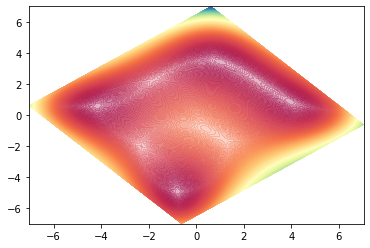

In [43]:
angle = 40
xx, yy, zz = contour(himmelblau())


radians = angle * np.pi/180

# counter-clockwise rotation matrix
# https://stackoverflow.com/questions/29708840/rotate-meshgrid-with-numpy
rotation_matrix = np.array([
    [np.cos(radians), -np.sin(radians)],
    [np.sin(radians), np.cos(radians)]
])
xx, yy = np.einsum('ji, mni -> jmn', rotation_matrix, np.dstack([xx, yy]))

plt.contourf(xx, yy, zz, levels=1000, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()), alpha=0.3)

We've successfully rotated the contour, but we see that the axis were left unchanges. So we didn't rotate the plot, but merely it's contents. 

At this point, I guess there are three options:
* use some image processing packages (like `PIL`, `imagemagick`), export the 2D plot as an image, rotate it and then display it
* hide the axes so we don't see that we've actually rotated only the content. 
* use a 3D plot (which can easily suport rotation as we've seen) and set a perpendicular viewing angle (birds-eye view) so the plot looks like a 2D one.

The first option looks like the biggest hack of all since it involves adding at least 2 new dependencies for this sole purpose (plus the additional computation).

The last one is easy to see without further experiments, so we only need to see how option 2 looks like.

Drawing the 2D plot on a 3D Axis and viewed from above. This makes it possible to dispay the rotated axis as well but also makes the plot smaller.

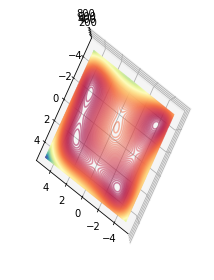

In [21]:
fig = plt.figure()

ax_ = fig.add_subplot(1, 2, 2, projection='3d')

angle = 125

## plot_function_2d
xx, yy = np.meshgrid( 
    np.linspace(-5, 5, num=100),
    np.linspace(-5, 5, num=100)
)
zz = himmelblau()(xx, yy)

ax_.contour(xx, yy, zz, levels=200, offset=0, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()), alpha=0.5, zorder=1)
ax_.view_init(90, angle)

plt.tight_layout()

I think I will stick with the 2D approach as the contour is bigger.

### Rotation function



The `rotate` function bellow looks way more complex than we've sketched it out above, and this is because it is now handling two use cases that it needs to disambiguate:
* the case when it receives meshgrids (xx, yy) when called to rotate the contour plots
& the case when it receives points we want to draw on the contour (like the minimum values or the trace of an optimizer) which are not of the same shape as a meshgrid so have a diffrent type of math operation applyed on them (mainly due to vectorisation).

In [0]:
from typing import Tuple

def rotate(_x: np.ndarray, _y: np.ndarray, angle=45) -> Tuple[np.ndarray, np.ndarray]:
    def __is_mesh(x: np.ndarray) -> bool:
        __is_2d = len(x.shape) == 2
        if __is_2d:
            __is_repeated_on_axis_0 = np.allclose(x.mean(axis=0), x[0, :])
            __is_repeated_on_axis_1 = np.allclose(x.mean(axis=1), x[:, 0])
            __is_repeated_array = __is_repeated_on_axis_0 or __is_repeated_on_axis_1
            return __is_repeated_array
        else:
            return False

    def __is_single_dimension(x: np.ndarray) -> bool:
        # when the function only has one minimum the initial x will have the shape (1,)
        # and doing a np.squeeze before calling this function will result in a x of shape () 
        # when we reach this control point 
        _is_scalar_point = len(x.shape) == 0
        return len(x.shape) == 1 or _is_scalar_point

    def __rotate_mesh(xx: np.ndarray, yy: np.ndarray) -> np.ndarray:
        xx, yy = np.einsum('ij, mnj -> imn', rotation_matrix, np.dstack([xx, yy]))
        return xx, yy

    def __rotate_points(x: np.ndarray, y: np.ndarray) -> np.ndarray:
        points = np.hstack((x[:, np.newaxis], y[:, np.newaxis]))
        # anti-clockwise rotation matrix
        x, y = np.einsum('mi, ij -> jm',  points, np.array([
            [np.cos(radians), -np.sin(radians)],
            [np.sin(radians), np.cos(radians)]
        ]))
        return x, y

    # apply rotation
    angle = (angle + 90) % 360
    radians = angle * np.pi/180

    # clockwise rotation matrix
    rotation_matrix = np.array([
        [np.cos(radians), np.sin(radians)],
        [-np.sin(radians), np.cos(radians)]
    ])

    if __is_mesh(_x) and __is_mesh(_y):
        _x, _y = __rotate_mesh(_x, _y)
    elif __is_single_dimension(np.squeeze(_x)) and __is_single_dimension(np.squeeze(_y)):
        def __squeeze(_x):
            """
            We need to reduce the redundant 1 domensions from shapes like (3, 1, 2) to (3, 2), 
            but at the same time, making sure we don't end up with scalar values (going from (1, 1) to a shape ())

            We need at least a shape of (1,)
            """
            if len(np.squeeze(_x).shape) == 0:
                return np.array([np.squeeze(_x)])
            else:
                return np.squeeze(_x)

        _x, _y = __squeeze(_x), __squeeze(_y) 
        _x, _y = __rotate_points(_x, _y)
    else:
        raise AssertionError(f"Unknown rotation types for shapes {_x.shape} and {_y.shape}")
    return _x, _y

The `np.einsum` part is the core of the function, and it's operation is more complex, leaving its explanation for a future post. 


Another interesting bit of it is the way the code bellow works, namely how the parameters are returned. 

```python
xx, yy = np.einsum('ij, mnj -> imn', rotation_matrix, np.dstack([xx, yy]))
```


Normally, any `np.` prefixed operation returns a `np.ndarray` but in this case we see that the `enisum` function is able to destructure the return into two separate parameters `xx` and `yy`. This happens with the help of the `np.dstack` function.

Let's see what it does, bellow:

In [45]:
print(np.dstack([xx, yy]).shape)
np.dstack([xx, yy])[:3, :3, :]

(100, 100, 2)


array([[[-5.       , -5.       ],
        [-4.8989899, -5.       ],
        [-4.7979798, -5.       ]],

       [[-5.       , -4.8989899],
        [-4.8989899, -4.8989899],
        [-4.7979798, -4.8989899]],

       [[-5.       , -4.7979798],
        [-4.8989899, -4.7979798],
        [-4.7979798, -4.7979798]]])

So `dstack` just made a stack of it's arguments, on a new, rightmost axis (the last `2` value from the shape). This shape, coupled with the specified `einsum` operation, where both `i` and `j` are equal to `2` gives a result with the shape of (2, 100, 100) semantically simialr to a tuple `(xx.shape(100, 100), yy.shape(100, 100))`. This shape enbles the python language to destructure this return into `2` independent values, the ones we actually wanted. 

### Single points rotation

The gist of single points rotation is a matrix multiplication but since the meshgrid is implemented in `einsum` notation as is rather elegant, at least because of the arguments decomposition trick, I'll try experimenting a bit to replicate the matrix multiplication it with `einsum` as well.

In [31]:
angle = 225

# apply rotation
angle = (angle) % 360
radians = angle * np.pi/180


# clockwise rotation matrix
rotation_matrix = np.array([
    [np.cos(radians), -np.sin(radians)],
    [np.sin(radians), np.cos(radians)]
])

coords[:, [0, 1]] @ rotation_matrix

(array([[-1.41421356e+00, -2.22044605e-16],
        [ 4.44089210e-16, -2.82842712e+00],
        [-4.44089210e-16,  4.24264069e+00],
        [-5.65685425e+00, -8.88178420e-16]]),)

Ok, this is the (correct) result we're getting using the plain matrix multiplication. Our goal is the `einsum` operation that computes these, but reshapes them as well in `(2, 4)` so we can later on decompose them as `(4,)` and `(4,)` into `x` and `y` coordinates. 

We start of with 4 points, where we also have the `z` value (the function evaluation on the first two coordinates), so a shape of `(4, 2+1)`

In [53]:
coords.shape

(4, 3)

We'll be receiving `x` and `y` values in the following shape, so this is what we have to work with:

In [54]:
_x = coords[:, [0]]
_y = coords[:, [1]]
_x.shape, _y.shape

((4, 1), (4, 1))

Since the `rotation_matrix` is of shape `(2,2)`, the final `einsum` operation is:

```
mi, ij -> jm

or 
(nr_points, 2), (2, 2) -> (2, nr_points)
```

In [59]:
__x, __y = np.einsum('mi, ij -> jm',  np.hstack((coords[:, [0]], coords[:, [1]])), rotation_matrix)
__x, __y

(array([-1.41421356e+00,  4.44089210e-16, -4.44089210e-16, -5.65685425e+00]),
 array([-2.22044605e-16, -2.82842712e+00,  4.24264069e+00, -8.88178420e-16]))

### Wrapping function

Again, let's wrap everything up in a single function to see where we are up until now. 

Comming back to the wraping function, we wan now also use the `rotation` function to rotate both the contour and the minimum values. 

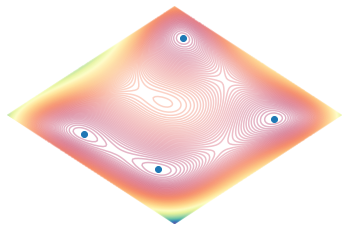

In [9]:
def plot_function_2d(function: Ifunction, ax=None, angle=45, zoom_factor=0):
    (x_min, x_max), (y_min, y_max) = zoom(*function.domain(), zoom_factor)

    xx, yy, zz = contour(function, x_min, x_max, y_min, y_max)

    ax = ax if ax else plt.gca()
    
    xx, yy = rotate(xx, yy, angle=angle)    # I wonder why I shoudn't also rotate zz?!

    ax.contour(xx, yy, zz, levels=200, cmap='Spectral', norm=colors.Normalize(vmin=zz.min(), vmax=zz.max()), alpha=0.3)
    
    min_coords = function.min()
    ax.scatter(*rotate(min_coords[:, 0], min_coords[:, 1], angle=angle))
    ax.axis("off")

plot_function_2d(himmelblau())

## A combined plot, with both the 3D and the 2D contours side by side

Using both 2D and 3D plotting function we can combine them to be shown on the same figure, and using the same rotation.

As allways, we will first sketch the code in bulk then tie it up in a single function.

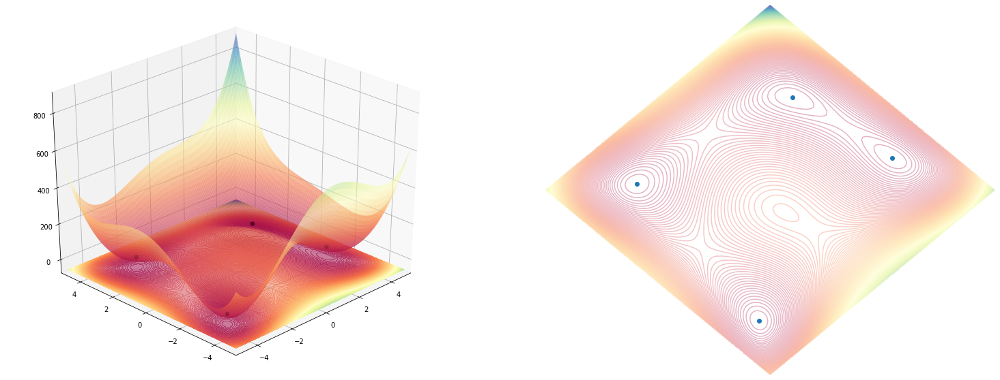

In [12]:
fig = plt.figure(figsize=(26, 10))

ax_3d = fig.add_subplot(1, 2, 1, projection='3d')
ax_2d = fig.add_subplot(1, 2, 2)

angle = 225

function = himmelblau()

plot_function_3d(function, ax=ax_3d, azimuth=30, angle=angle)
plot_function_2d(function, ax=ax_2d, angle=angle)

### Wrapping function with both figures

The 2D and 3D plots can now be combined in a unified function that you can see bellow:

(<Figure size 1872x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f8be6801a20>)

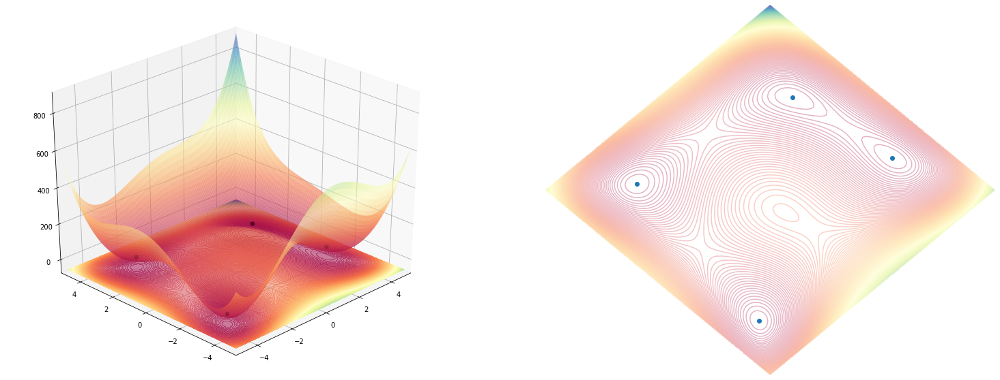

In [10]:
def plot_function(function: Ifunction, angle=45, zoom_factor=0, azimuth_3d=30, fig=None, ax_2d=None, ax_3d=None):
    fig = plt.figure(figsize=(26, 10)) if fig is None else fig
    ax_3d = fig.add_subplot(1, 2, 1, projection='3d') if ax_3d is None else ax_3d
    ax_2d = fig.add_subplot(1, 2, 2) if ax_2d is None else ax_2d

    plot_function_3d(function=function, ax=ax_3d, azimuth=azimuth_3d, angle=angle, zoom_factor=zoom_factor)
    plot_function_2d(function=function, ax=ax_2d, angle=angle, zoom_factor=zoom_factor)

    return fig, ax_3d, ax_2d

plot_function(himmelblau(), angle=225)

# Implementing a few other functions so see how they look like

I guess we now have sufficient machinerey to try plotting different interesting functions. But first, let's just define them.

### mc_cormick


In [11]:
class mc_cormick(Ifunction):
    def __call__(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        """
        Computes the given function
        """
        return np.sin(x+y) + (x-y)**2-1.5*x+2.5*y+1
    
    def _min(self) -> np.ndarray:
        """
        Returns a np.array of the shape (k, 2) with all the minimum k points of this function. 
        The two values of the second dimension are the (x,y) coordinates of the minimum values 
        """
        return np.array([
            [-0.54719, -1.54719],
        ])

    def domain(self) -> np.ndarray:
        """
        Returns the ((x_min, x_max), (y_min, y_max)) values where this function 
        is of most interest
        """
        return np.array([
            [-1.5, 4],
            [-3, 4]
        ])

mc_cormick().min()

array([[-0.54719   , -1.54719   , -1.91322295]])

(<matplotlib.axes._subplots.Axes3DSubplot at 0x7ff55b7a0080>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff559ce9828>)

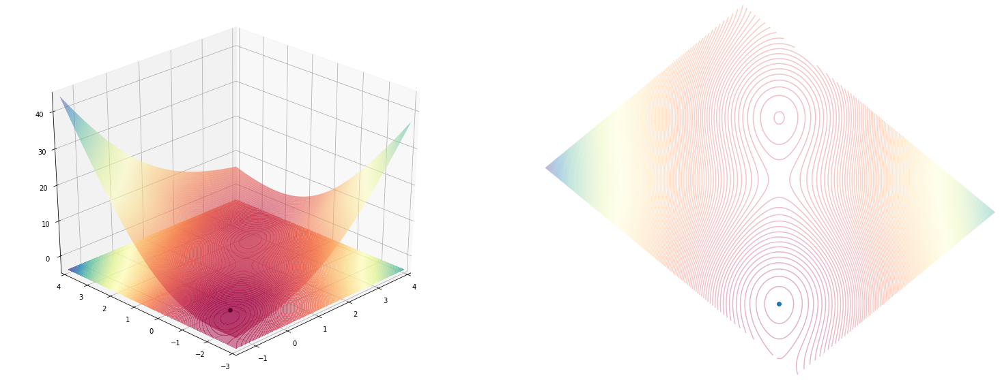

In [24]:
plot_function(mc_cormick(), angle=225)

### holder_table

In [12]:
class holder_table(Ifunction):
    def __call__(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        """
        Computes the given function
        """
        return -np.abs(np.sin(x)*np.cos(y)*np.exp(np.abs(1-np.sqrt(x**2+y**2)/np.pi)))
    
    def _min(self) -> np.ndarray:
        """
        Returns a np.array of the shape (k, 2) with all the minimum k points of this function. 
        The two values of the second dimension are the (x,y) coordinates of the minimum values 
        """
        return np.array([
            [8.05502, 9.66459],
            [8.05502, -9.66459],
            [-8.05502, 9.66459],
            [-8.05502, -9.66459],
        ])

    def domain(self) -> np.ndarray:
        """
        Returns the ((x_min, x_max), (y_min, y_max)) values where this function 
        is of most interest
        """
        return np.array([
            [-10, 10],
            [-10, 10]
        ])

holder_table().min()

array([[  8.05502   ,   9.66459   , -19.20850257],
       [  8.05502   ,  -9.66459   , -19.20850257],
       [ -8.05502   ,   9.66459   , -19.20850257],
       [ -8.05502   ,  -9.66459   , -19.20850257]])

(<Figure size 1872x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fe2288bc898>)

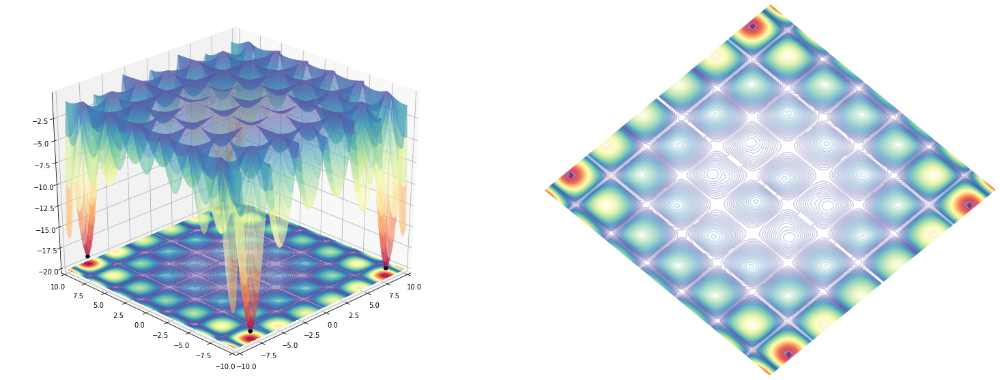

In [10]:
plot_function(holder_table(), angle=225)

## Drawing lines on the 3D plot

Some optimisation strategies work by starting off with multiple initial points, that are constantly updated on each iteration of the optimisation.

These points are viewed (as is the case of Nelder-Mead algo) as a convex polygon, which means we need to not only show the shapes but also the lines connecting them. 

To enable this use-case we need to experiment a bit with showind lines on both plots. 

### Dealing with the `zorder` of 3D axes

The problems with lines though (and it was hard to anticipate how difficult this might be) is that in the case of 3D plots, they are **allways** shown behind the contour plot. 

I don't really understand why this decision was made but it seems to be a side-effect of having a 3D framework squashed on top of a 2D desined one. There are some rough edges and this is one of them.

It seems that what is actually happening is that the `zorder` parameter which usually control the order in which figures are drawn on the screen is ignored for hte 3D objects. 

[One suggestion](https://stackoverflow.com/questions/20781859/drawing-a-line-on-a-3d-plot-in-matplotlib) was to override the `zorder` attribute in a custom class to force some objects (lines in this case) to be shown above the graph.

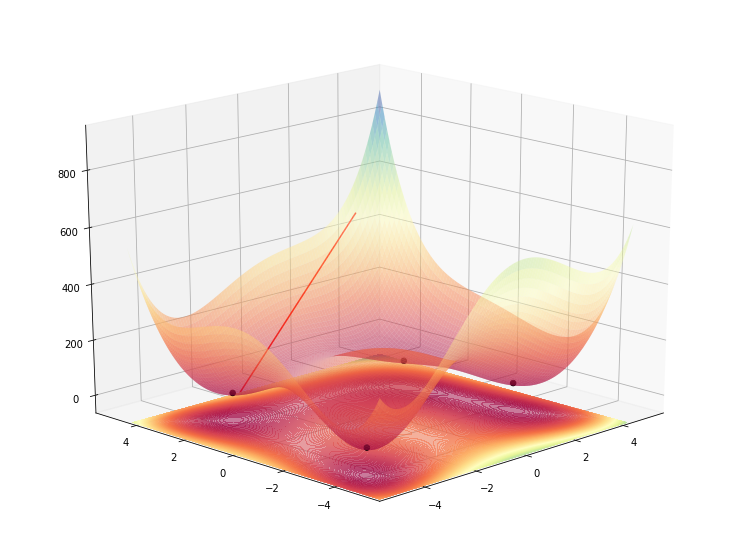

In [29]:
fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')

plot_function_3d(himmelblau(), ax=ax, azimuth=20, angle=225)

from mpl_toolkits.mplot3d.art3d import Line3D, Poly3DCollection
class FixZorderLine3D(Line3D):
    @property
    def zorder(self):
        return 4

    @zorder.setter
    def zorder(self, value):
        pass


lines = ax.plot([3, -4], [4, 2], [500, 0], color="red", zorder=1, alpha=1)
# hack fix for the zorder fo the Line3D and plot_contour, taken from
# https://stackoverflow.com/questions/20781859/drawing-a-line-on-a-3d-plot-in-matplotlib
for line in lines:
    line.__class__ = FixZorderLine3D


Going even more into the guts of `matplotlib` (way more than I'd like, actually) we see that the lines are converted into a collection of lines, so we might simplify the last loop where we did the recasting of the class of each line, into a single recast, on the full collection object.

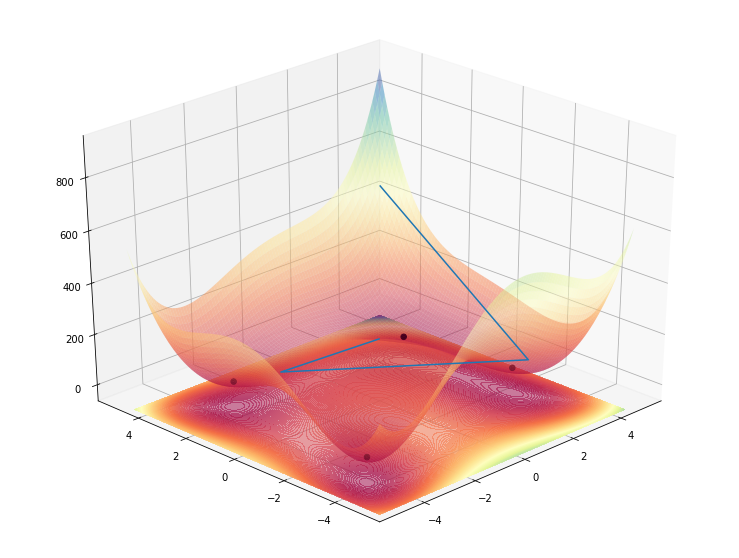

In [34]:
from mpl_toolkits.mplot3d.art3d import Line3DCollection
class FixZorderCollection(Line3DCollection):
    @property
    def zorder(self):
        return 1000

    @zorder.setter
    def zorder(self, value):
        pass

fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')

# hack fix for the zorder fo the Line3D and plot_contour, taken from
# https://stackoverflow.com/questions/20781859/drawing-a-line-on-a-3d-plot-in-matplotlib
plot_function_3d(himmelblau(), ax=ax, azimuth=30, angle=225)
ax.plot_wireframe(np.array([[1], [-2], [3], [4]]), np.array([[1], [2], [-3], [4]]), np.array([[himmelblau()(1, 1)+1], [himmelblau()(-2, 2) + 1], [100], [500]]))
ax.collections[-1].__class__ = FixZorderCollection

This works, as intended, but besides beeing a huge ugly hack, it's also strange to look at since now, the lines are actually floating above the 3D contour and not *inside* as it would be normal.

What worked in the end is a carefull caligration of the transparency of the contours and the fact that multiple surfaces of the plot overlayed one on top of the other give the impression of a higher transparency, making the line look "beneath".

So even though the line is actually drawn under the contour, because the contour has transparency (which isn't too light) makes it so that when multiple shapes of the contour overlap, their transparencies effect add up, making the line look between the two... somehow..

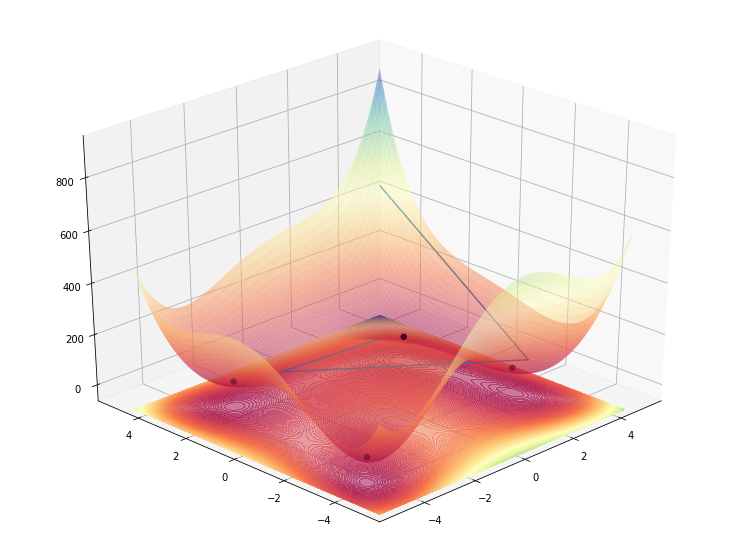

In [33]:
fig = plt.figure(figsize=(13, 10))
ax = plt.axes(projection='3d')

plot_function_3d(himmelblau(), ax=ax, azimuth=30, angle=225)
ax.plot_wireframe(np.array([[1], [-2], [3], [4]]), np.array([[1], [2], [-3], [4]]), np.array([[himmelblau()(1, 1)+1], [himmelblau()(-2, 2) + 1], [100], [500]]))

Now, let's put join foreces with the 2D plot and display the lines on both graphs.

In [0]:
points = np.array([
    [1, 1],
    [-2, 2],
    [3, -3],
    [4, 4]
])

function = himmelblau()
coords = function.coord(points)

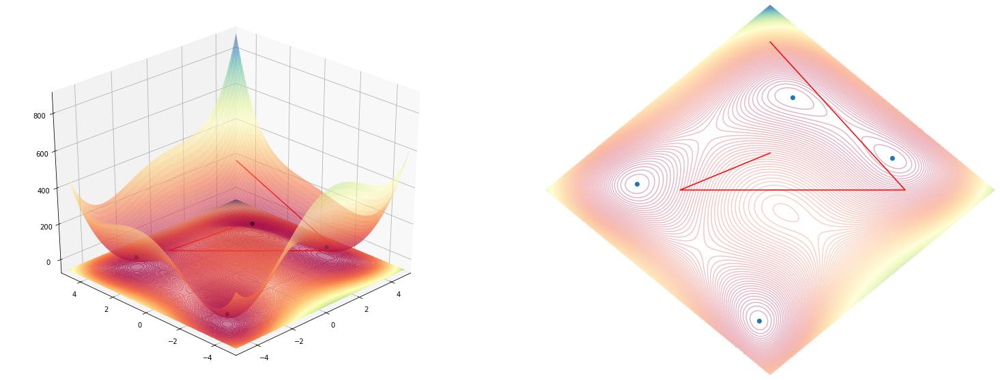

In [52]:
rotation=225

fig, ax_3d, ax_2d = plot_function(function, angle=rotation)

ax_3d.plot_wireframe(coords[:, [0]], coords[:, [1]], coords[:, [2]], color='r')    
ax_2d.plot(*rotate(coords[:, 0], coords[:, 1], angle=rotation), color='r')

In [50]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

@interact
def plot_interactive(azimuth=(0, 90), rotation=45, zoom_factor=(-1, 1, 0.1), lines=[True, False]):
    fig, ax_3d, ax_2d = plot_function(function, angle=rotation, azimuth_3d=azimuth, zoom_factor=zoom_factor)

    if lines:
        ax_3d.plot_wireframe(coords[:, [0]], coords[:, [1]], coords[:, [2]])    
        ax_2d.plot(*rotate(coords[:, 0], coords[:, 1], angle=rotation))
    else:
        ax_3d.scatter3D(coords[:, [0]], coords[:, [1]], coords[:, [2]])
        ax_2d.scatter(*rotate(coords[:, 0], coords[:, 1], angle=rotation))

interactive(children=(IntSlider(value=45, description='azimuth', max=90), IntSlider(value=45, description='rot…

# Show me the money!

Now that we have all in place we just need to show how this is usefull, which means displaying an actual use-case, an optimisation taking place.

## SGD optimizer tracing

 The simplest optimizer to implement that I know of is `stochastic gradient descent` (`SGD`) which has the update rule:

$$ x = x - \alpha * \frac{\partial f(x, y)}{\partial x} $$
$$ y = y - \alpha * \frac{\partial f(x, y)}{\partial y} $$


Unfortunately, as you can see from the formula, there is that `partial derivative` part that we have to deal with in order to make this work.

We could (at least for this instance) compute the partial derivative function analitically (by hand) and define a function to implement that. That also means that we need to update the function interface class and add a custom method with this `gradient` function on all functions we wish to optimize (deriving the gradient on all functions we wish to display). Also, this `gradient` functionality is not actually generic (or used at all) by all the types of optimisations what we wish to investigate so incorporating it into the function might not be a good place to put it.

So this, gradient, brings with it a lot of changes throughout.

Fortunately, we can use auto-differentiation. `JAX` one such library that (given some contraints) computes the gradient function for you.

We first define, our initial toy function, and even though this isn't required, change the type-hints to the appropriate class we are expecting to work with (`jax's own ndarray objects`)

In [13]:
import jax.numpy as jnp

def himmelblau_jnp(x: jnp.ndarray, y: jnp.ndarray) -> jnp.ndarray:
    return (x**2+y-11)**2 + (x+y**2-7)**2

himmelblau_jnp(0, 1)

136

Then we call `grad` which compiles a callable for us that we can use to get the partial derivatives with. The `argnum` part is needed because we have to specify that there are two parameters the parent function uses, and we want the derivative to both of them.

When implementing Linear Regression or Neural Networks, all the parameters usually sit in a single large matrix, which is the only argument of the function so usually we only need `argnums=0` which is the default. Except in this case where the parameters are passed individually.

In [14]:
from jax import grad

function_grad = grad(himmelblau_jnp, argnums=(0, 1))    # we want the derivative of both arguments
function_grad(2., 3.)

/usr/local/lib/python3.6/dist-packages/jax/lib/xla_bridge.py:116: UserWarning: No GPU/TPU found, falling back to CPU.
  warnings.warn('No GPU/TPU found, falling back to CPU.')


(DeviceArray(-24., dtype=float32), DeviceArray(40., dtype=float32))

Now that we have all that, we define our `sgd` optimisation routine and collect the resulting coordinates to show later on.

In [15]:
x, y = [0.], [0.]

def sgd_update(x, y, learning_rate=0.01):
    d_x, d_y = function_grad(x, y)
    x = x - learning_rate * d_x
    y = y - learning_rate * d_y
    return x, y

for i in range(100):
    _x, _y = sgd_update(x[-1], y[-1])        
    x.append(float(_x)), y.append(float(_y))

print(x, y)

[0.0, 0.14000000059604645, 0.3364902436733246, 0.6047241687774658, 0.9560018181800842, 1.3865301609039307, 1.860503911972046, 2.3018486499786377, 2.626394271850586, 2.808932065963745, 2.8941497802734375, 2.9341514110565186, 2.955716371536255, 2.9689831733703613, 2.9778130054473877, 2.9839375019073486, 2.988283395767212, 2.99141001701355, 2.9936795234680176, 2.995337724685669, 2.996554374694824, 2.997450113296509, 2.9981112480163574, 2.9985997676849365, 2.9989614486694336, 2.9992294311523438, 2.9994280338287354, 2.99957537651062, 2.9996845722198486, 2.999765634536743, 2.999825954437256, 2.999870777130127, 2.999904155731201, 2.9999287128448486, 2.9999470710754395, 2.9999606609344482, 2.9999706745147705, 2.9999783039093018, 2.999983787536621, 2.999988079071045, 2.9999911785125732, 2.999993324279785, 2.999994993209839, 2.9999961853027344, 2.99999737739563, 2.999997854232788, 2.9999983310699463, 2.9999988079071045, 2.9999990463256836, 2.9999992847442627, 2.9999992847442627, 2.99999952316284

A bit of quick sketching and fidling around with color maps, angles and rotations and we get this result:

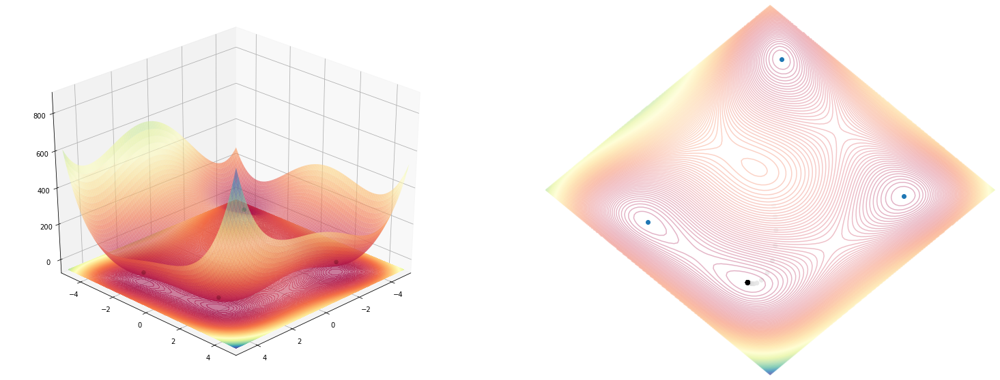

In [14]:
angle = 45
fig, ax_3d, ax_2d = plot_function(himmelblau(), angle=angle)

ax_2d.scatter(*rotate(np.array(x), np.array(y), angle=angle), c=np.arange(len(x)), cmap='binary')

Now the cool things is, that we can use `jax` straight as a numpy replacement, inside the same function definition where before we *assumed* (because that's what python does) we worked with `numpy` (notice bellow, we've just used the `himmelblau` class without making any change specific to `jax`).

If we pass in as arguments something that is `jax` compatible (like `jnp.arrays` or plaint `float`s) then we can call `grad` directly on the function and we will have the derivatives computed, for free, for us!

Now, how is `jax` able to do this (take a piece of arbitrary `python` and `numpy` code) and convert it into something `derivative` worthy, by only changing the underlying datastracture that you pass is a somewhat mistery. I assume that the `jax` shadow objects (like the `jnp.array` trace the objects that they interact with and so, coreate a dinamic graph of operations, somethign akin to what `PyTorch` or `TensorFlow 2.0 Eager` do).

In [16]:
x, y = [0.], [0.]

function_grad = grad(himmelblau(), argnums=(0, 1)) # argnums=(0, 1) sais that we want to see in the results the derivative of both arguments x and y

def sgd_update(x, y, learning_rate=0.01):
    d_x, d_y = function_grad(x, y)
    x = x - learning_rate * d_x
    y = y - learning_rate * d_y
    return x, y

for i in range(100):
    _x, _y = sgd_update(x[-1], y[-1])        
    x.append(float(_x)), y.append(float(_y))

print(x, y)

[0.0, 0.14000000059604645, 0.3364902436733246, 0.6047241687774658, 0.9560018181800842, 1.3865301609039307, 1.860503911972046, 2.3018486499786377, 2.626394271850586, 2.808932065963745, 2.8941497802734375, 2.9341514110565186, 2.955716371536255, 2.9689831733703613, 2.9778130054473877, 2.9839375019073486, 2.988283395767212, 2.99141001701355, 2.9936795234680176, 2.995337724685669, 2.996554374694824, 2.997450113296509, 2.9981112480163574, 2.9985997676849365, 2.9989614486694336, 2.9992294311523438, 2.9994280338287354, 2.99957537651062, 2.9996845722198486, 2.999765634536743, 2.999825954437256, 2.999870777130127, 2.999904155731201, 2.9999287128448486, 2.9999470710754395, 2.9999606609344482, 2.9999706745147705, 2.9999783039093018, 2.999983787536621, 2.999988079071045, 2.9999911785125732, 2.999993324279785, 2.999994993209839, 2.9999961853027344, 2.99999737739563, 2.999997854232788, 2.9999983310699463, 2.9999988079071045, 2.9999990463256836, 2.9999992847442627, 2.9999992847442627, 2.99999952316284

Let's try a different function, making sure that  it also works in other instances.

In [23]:
x, y = [0.], [0.]

function_grad = grad(mc_cormick(), argnums=(0, 1)) # argnums=(0, 1) sais that we want to see in the results the derivative of both arguments x and y

def sgd_update(x, y, learning_rate=0.01):
    d_x, d_y = function_grad(x, y)
    x = x - learning_rate * d_x
    y = y - learning_rate * d_y
    return x, y

for i in range(100):
    _x, _y = sgd_update(x[-1], y[-1])        
    x.append(float(_x)), y.append(float(_y))

print(x, y)

Exception: ignored

Unfortunately, while I thought that all functions will work out of the box just by replacing the `np.arrays` with `jnp.arrays` there is also another constraint on, using the `jax` derived methods that operate on these arrays, replacing the `np.<method>` ones.

In the case of `mc_cormick` class, the `__call__` function uses `np.sin`, a function that comes form `numpy` and which should be replaced with `jnp.sin`. This means that we need to either juse the `jnp.` prefix in all previously written code (and be explicit in doing this) or doing `import jax.numpy as np` and overriding the pure `numpy` code.

The first is more desirable while the latter is more pragmatic. I'm going to go with the second one, and update all my functinos to use explicitly the `jnp.` prefix so I know what I deal with.

In [17]:
import jax.numpy as jnp 

class jax_mc_cormick(mc_cormick):
    def __call__(self, x: jnp.ndarray, y: jnp.ndarray) -> np.ndarray:
        """
        Computes the given function
        """
        return jnp.sin(x+y) + (x-y)**2-1.5*x+2.5*y+1

class jax_holder_table(holder_table):
    def __call__(self, x: jnp.ndarray, y: jnp.ndarray) -> np.ndarray:
        """
        Computes the given function
        """
        return -jnp.abs(jnp.sin(x)*jnp.cos(y)*jnp.exp(jnp.abs(1-jnp.sqrt(x**2+y**2)/jnp.pi)))

x, y = [0.], [0.]
function_grad = grad(jax_mc_cormick(), argnums=(0, 1)) # argnums=(0, 1) sais that we want to see in the results the derivative of both arguments x and y

def sgd_update(x, y, learning_rate=0.01):
    d_x, d_y = function_grad(x, y)
    x = x - learning_rate * d_x
    y = y - learning_rate * d_y
    return x, y

for i in range(100):
    _x, _y = sgd_update(x[-1], y[-1])        
    x.append(float(_x)), y.append(float(_y))

print(x, y)

[0.0, 0.004999999888241291, 0.009204499423503876, 0.01265448797494173, 0.015389639884233475, 0.017448334023356438, 0.018867675215005875, 0.019683513790369034, 0.019930459558963776, 0.019641906023025513, 0.018850043416023254, 0.0175858773291111, 0.01587924174964428, 0.013758821412920952, 0.011252165772020817, 0.008385710418224335, 0.005184791516512632, 0.0016736702527850866, -0.0021244490053504705, -0.006187397986650467, -0.010494021698832512, -0.0150241544470191, -0.019758598878979683, -0.024679094552993774, -0.02976830117404461, -0.03500977158546448, -0.04038791358470917, -0.04588798061013222, -0.051496028900146484, -0.0571988970041275, -0.06298418343067169, -0.06884019821882248, -0.07475595921278, -0.08072115480899811, -0.086726114153862, -0.09276177734136581, -0.09881968051195145, -0.10489190369844437, -0.11097107827663422, -0.11705033481121063, -0.12312329560518265, -0.1291840374469757, -0.13522708415985107, -0.14124736189842224, -0.14724019169807434, -0.15320125222206116, -0.15912

## Animating the complex plot, with the optimisation result

Since we have an optimisation that progresses over time, it's only natural that we show it as an animation. Like the one you see bellow:

In [44]:
import matplotlib.animation as animation
from IPython.display import HTML, display

x, y = [0.], [0.]

def single_frame(i, _ax_3d, _ax_2d):
    print(type(_ax_3d), type(_ax_2d))
    _ax_3d.clear()
    _ax_2d.clear()
    
    _x, _y = sgd_update(x[-1], y[-1])        
    x.append(float(_x)), y.append(float(_y))

    plot_function(function, angle=angle, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d)
    _ax_2d.scatter(*rotate(np.array(x), np.array(y), angle=angle), c=np.arange(len(x)), cmap='binary')

    _ax_2d.plot()
    # _ax_3d.plot()


function = himmelblau()

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(function, fig=fig)
fig.tight_layout()

frames = 6
animator = animation.FuncAnimation(fig, single_frame, fargs=(ax_3d, ax_2d), frames=frames, interval=800, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>
<class 'matplotlib.axes._subplots.Axes3DSubplot'> <class 'matplotlib.axes._subplots.AxesSubplot'>


Also, some abstraction patterns seem to become obvious:
* the initial plot (the two countour figures) are actually static
* we may need to draw multiple traces on the same plot from multiple optimisation strategies 
* the two points above may mean we need a unifying object for all the artifacts of the static plots (`fig`, `ax_2d` and `ax_3d`)

Just as  quick usefefull visualisation, look at what happens when you have a *too high* learning rate.

In [37]:
import matplotlib.animation as animation
from IPython.display import HTML, display

x, y = [1.], [1.]

def single_frame(i, _ax_3d, _ax_2d):
    _ax_3d.clear()
    _ax_2d.clear()
    print(x, y)
    _x, _y = sgd_update(x[-1], y[-1], learning_rate=0.5)        
    x.append(float(_x)), y.append(float(_y))

    plot_function(function, angle=angle, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d)
    _ax_2d.scatter(*rotate(np.array(x), np.array(y), angle=angle), c=np.arange(len(x)), cmap='binary')

    _ax_2d.plot()


function = jax_mc_cormick()
function_grad = grad(function, argnums=(0, 1))

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(function, fig=fig)
fig.tight_layout()

frames = 6
animator = animation.FuncAnimation(fig, single_frame, fargs=(ax_3d, ax_2d), frames=frames, interval=800, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

[1.0] [1.0]
[1.0, 1.958073377609253] [1.0, -0.04192662239074707]
[1.0, 1.958073377609253, 0.8773366212844849] [1.0, -0.04192662239074707, 0.8773366212844849]
[1.0, 1.958073377609253, 0.8773366212844849, 1.7187578678131104] [1.0, -0.04192662239074707, 0.8773366212844849, -0.28124213218688965]
[1.0, 1.958073377609253, 0.8773366212844849, 1.7187578678131104, 0.4023146629333496] [1.0, -0.04192662239074707, 0.8773366212844849, -0.28124213218688965, 0.4023146629333496]
[1.0, 1.958073377609253, 0.8773366212844849, 1.7187578678131104, 0.4023146629333496, 0.8056254386901855] [1.0, -0.04192662239074707, 0.8773366212844849, -0.28124213218688965, 0.4023146629333496, -1.1943745613098145]
[1.0, 1.958073377609253, 0.8773366212844849, 1.7187578678131104, 0.4023146629333496, 0.8056254386901855, -0.9070665836334229] [1.0, -0.04192662239074707, 0.8773366212844849, -0.28124213218688965, 0.4023146629333496, -1.1943745613098145, -0.9070665240287781]


## [Bonus] Using the `jax` optimizers

What would be even cooler is to use the optimizers implemented inside `jax`.

Here, I've reimplemented the `SGD` optimizer, which is easly enough to compute, but some others like `adam` which would be nice to also see in action would not be as easy to implement.

`JAX` is kind of rough on this front, and the optimizers (for now) sit inside the `experimental` submodule which means that their API might change in the future. 

An optimizer is a function that has some initialization parameters, and which returns 3 functions:
* `init` - is a function to which you pass all the initial values of your hidden parameters and you get back a `state` object, which is a `pytree` structure (some internal representation). This is a bit confusing and I'm guessing this intermediate `pytree` thing might disappear from the API in the near future.
* `update` - is the function that does a single update pass over the whole parameters. It receives as inputs:
    * `i` - the count of the current iteration. This usefull because, depending on the optimizer implementation, you can have different learning properties at each iteration (like some annealing strategy for the learning rate, etc..)
    * `g` - the gradient values (you get these by extracting the params from the `state` function, using the `get_params` function bellow (these are the variables that will get updated by the optimizer). Then pass these onto your gradient function and its results as input to this function. 
    * `state` - that `pytre` structure that you've got after calling `init` (and which you'll contrantly replace with the result of this `update` function call)
* `get_params` - a `utils` function that extracts the param object from a known `state` object (which is a `pytree`). 

So the full flow of the above, in code is shown bellow:

In [58]:
 grad(himmelblau(), argnums=(0, 1))(*get_params(state))

(DeviceArray(-36., dtype=float32), DeviceArray(-32., dtype=float32))

In [60]:
from jax.experimental.optimizers import sgd


init, update, get_params = sgd(step_size=0.001)


state = init((1., 2.)) # initialize the optimizer with some initial weights and get a state back
print(state)
print(get_params(state))    # you use this function to extract the weight values from the state object
grad_function = grad(himmelblau(), argnums=(0, 1))  # you build the function that will compute your gradients
state = update(0, grad_function(*get_params(state)), state)    # you call update with a iteration number, the gradient of the params, and the previous state and you get back a new state 
print(state)

OptimizerState(packed_state=((1.0,), (2.0,)), tree_def=PyTreeDef(tuple, [*,*]), subtree_defs=(*, *))
(1.0, 2.0)
OptimizerState(packed_state=((DeviceArray(1.036, dtype=float32),), (DeviceArray(2.032, dtype=float32),)), tree_def=PyTreeDef(tuple, [*,*]), subtree_defs=(*, *))


And you can see the result of running 10 iterations of the above, in a loop. It moves to some direction, and I'm sure you're eager to see where, on the graph...

In [62]:
grad_function = grad(himmelblau(), argnums=(0, 1))
def run():
    state = init((1., 2.))
    for i in range(10):
        params = get_params(state)
        yield params
        state = update(i, grad_function(*params), state)
    
[(float(x), float(y)) for x, y in run()]

[(1.0, 2.0),
 (1.0360000133514404, 2.0320000648498535),
 (1.0723856687545776, 2.062704086303711),
 (1.1091352701187134, 2.092081069946289),
 (1.1462260484695435, 2.1201066970825195),
 (1.18363356590271, 2.1467630863189697),
 (1.22133207321167, 2.1720387935638428),
 (1.2592941522598267, 2.1959288120269775),
 (1.2974909543991089, 2.2184340953826904),
 (1.335891842842102, 2.239561080932617)]

Before actually showing these numbers on the chart, we might spend some time on encapsulating this whay of using the optimizer (in general) into a class that has a *nice* (depends on taste) API. Later on, we can just substitute the optimizer and see what happens!

In [66]:
class optimize:
    def __init__(self, function):
        self.function = function
        self.grad_function = grad(function, argnums=(0, 1))
        self.x, self.y = list(), list()

    def using(self, optimizer):
        self._init, self._update, self._get_params = optimizer
        return self

    def start_from(self, params):
        self.state = self._init(tuple(params))
        return self

    def update(self, nr_iterations=1):
        for i in range(nr_iterations):
            params = self._get_params(self.state)
            self.__add_point(*params)
            self.state = self._update(i, self.grad_function(*params), self.state)
        return self.x, self.y            

    def __add_point(self, _x, _y):
        """
        Adds the x and y coordinates for these point to the trace lists
        """
        self.x.append(float(_x))
        self.y.append(float(_y))


optimize(himmelblau())\
    .using(sgd(step_size=0.001))\
    .start_from([1., 1.])\
    .update(10)

([1.0,
  1.0460000038146973,
  1.0928562879562378,
  1.1405162811279297,
  1.1889206171035767,
  1.2380036115646362,
  1.2876930236816406,
  1.3379102945327759,
  1.388570785522461,
  1.4395838975906372],
 [1.0,
  1.0379999876022339,
  1.0759831666946411,
  1.1138836145401,
  1.1516332626342773,
  1.1891623735427856,
  1.2264001369476318,
  1.2632750272750854,
  1.299715518951416,
  1.3356506824493408])

In [76]:
import matplotlib.animation as animation
from IPython.display import HTML, display


def single_frame(i, optimisation, _ax_3d, _ax_2d, angle):
    _ax_3d.clear()
    _ax_2d.clear()
    
    x, y = optimisation.update()        
    x, y = np.array(x), np.array(y)

    plot_function(optimisation.function, angle=angle, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d)
    _ax_2d.scatter(*rotate(x, y, angle=angle), c=np.arange(len(x)), cmap='cool')
    _ax_3d.scatter3D(x, y, optimisation.function(x, y), c=np.arange(len(x)), cmap='cool')

    _ax_2d.plot()


angle=225
optimisation = optimize(himmelblau())\
    .using(sgd(step_size=0.01))\
    .start_from([-1., -1.])\

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(optimisation.function, fig=fig, angle=angle)
fig.tight_layout()

frames = 20
animator = animation.FuncAnimation(fig, single_frame, fargs=(optimisation, ax_3d, ax_2d, angle), frames=frames, interval=250, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

You can hardly see it, in the 3D plot, because of the transparancy issue, but on the 2D it is really informative!

# Conclusions

This has been a really long and tiring post to write (maybe two weeks of full-time work?!). Overall, I can say:
* 3D support in matplotlib is quite limited
* the visualisation really help in understand how a certain optimiser is behaving
* `jax` is cool but the optimizers API is a bit rough
* the 3D view doesn't add much value oveall 

# [Bonus, Bonus] How does SGD handle a *hard* function? 

In [80]:
import matplotlib.animation as animation
from IPython.display import HTML, display


def single_frame(i, optimisation, _ax_3d, _ax_2d, angle):
    _ax_3d.clear()
    _ax_2d.clear()
    
    x, y = optimisation.update()        
    x, y = np.array(x), np.array(y)
    print(x, y)

    plot_function(optimisation.function, angle=angle, fig=fig, ax_3d=_ax_3d, ax_2d=_ax_2d)
    _ax_2d.scatter(*rotate(x, y, angle=angle), c=np.arange(len(x)), cmap='cool')
    _ax_3d.scatter3D(x, y, optimisation.function(x, y), c=np.arange(len(x)), cmap='cool')

    _ax_2d.plot()


angle=225
optimisation = optimize(jax_holder_table())\
    .using(sgd(step_size=0.3))\
    .start_from([-1., -1.])\

fig = plt.figure(figsize=(13,5))
fig, ax_3d, ax_2d = plot_function(optimisation.function, fig=fig, angle=angle)
fig.tight_layout()

frames = 20
animator = animation.FuncAnimation(fig, single_frame, fargs=(optimisation, ax_3d, ax_2d, angle), frames=frames, interval=250, blit=False)
display(HTML(animator.to_html5_video()))
plt.close()

[-1.] [-1.]
[-1.         -1.09856904] [-1.         -0.57867539]
[-1.         -1.09856904 -1.1924032 ] [-1.         -0.57867539 -0.25041041]
[-1.         -1.09856904 -1.1924032  -1.2352618 ] [-1.         -0.57867539 -0.25041041 -0.09040605]
[-1.         -1.09856904 -1.1924032  -1.2352618  -1.25142336] [-1.         -0.57867539 -0.25041041 -0.09040605 -0.03152514]
[-1.         -1.09856904 -1.1924032  -1.2352618  -1.25142336 -1.25790954] [-1.         -0.57867539 -0.25041041 -0.09040605 -0.03152514 -0.01097676]
[-1.         -1.09856904 -1.1924032  -1.2352618  -1.25142336 -1.25790954
 -1.26062083] [-1.         -0.57867539 -0.25041041 -0.09040605 -0.03152514 -0.01097676
 -0.00382642]
[-1.         -1.09856904 -1.1924032  -1.2352618  -1.25142336 -1.25790954
 -1.26062083 -1.26177108] [-1.         -0.57867539 -0.25041041 -0.09040605 -0.03152514 -0.01097676
 -0.00382642 -0.00133481]
[-1.         -1.09856904 -1.1924032  -1.2352618  -1.25142336 -1.25790954
 -1.26062083 -1.26177108 -1.26226151] [-1.0

Not that good...